In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
  # Load the dataset
df = pd.read_csv("PEP1.csv")
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [3]:
 # Identify the shape of the dataset
print(f"Dataset shape: {df.shape}")

Dataset shape: (1460, 81)


In [4]:
 # Identify variables with null values
print(f"Variables with null values: {df.isnull().sum()[df.isnull().sum() > 0]}")

Variables with null values: LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [5]:
 # Identify variables with unique values
print(f"Variables with unique values: {df.nunique()[df.nunique() == 1]}")

Variables with unique values: Series([], dtype: int64)


In [6]:
 # Generate a separate dataset for numerical and categorical variables
num_df = df.select_dtypes(include=np.number)
cat_df = df.select_dtypes(include="object")

In [7]:
# EDA of numerical variables
# Missing value treatment
num_df.fillna(num_df.mean(), inplace=True)

Id skewness: 0.0
MSSubClass skewness: 1.4076567471495591
LotFrontage skewness: 2.3849501679427925
LotArea skewness: 12.207687851233496
OverallQual skewness: 0.2169439277628693
OverallCond skewness: 0.6930674724842182
YearBuilt skewness: -0.613461172488183
YearRemodAdd skewness: -0.5035620027004709
MasVnrArea skewness: 2.676411784729959
BsmtFinSF1 skewness: 1.685503071910789
BsmtFinSF2 skewness: 4.255261108933303
BsmtUnfSF skewness: 0.9202684528039037
TotalBsmtSF skewness: 1.5242545490627664
1stFlrSF skewness: 1.3767566220336365
2ndFlrSF skewness: 0.8130298163023265
LowQualFinSF skewness: 9.011341288465387
GrLivArea skewness: 1.3665603560164552
BsmtFullBath skewness: 0.596066609663168
BsmtHalfBath skewness: 4.103402697955168
FullBath skewness: 0.036561558402727165
HalfBath skewness: 0.675897448233722
BedroomAbvGr skewness: 0.21179009627507137
KitchebvGr skewness: 4.488396777072859
TotRmsAbvGrd skewness: 0.6763408364355531
Fireplaces skewness: 0.6495651830548841
GarageYrBlt skewness: -0.

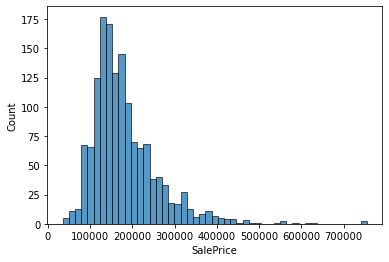

In [8]:
# Identify the skewness and distribution
for col in num_df.columns:
    skewness = num_df[col].skew()
    print(f"{col} skewness: {skewness}")
    
# Create a histogram plot for the column
sns.histplot(num_df[col])
plt.show()

In [9]:
# Identify significant variables using a correlation matrix
corr_matrix = num_df.corr()
corr_matrix["SalePrice"].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
MasVnrArea       0.475241
GarageYrBlt      0.470177
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.334901
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchebvGr      -0.135907
Name: SalePr

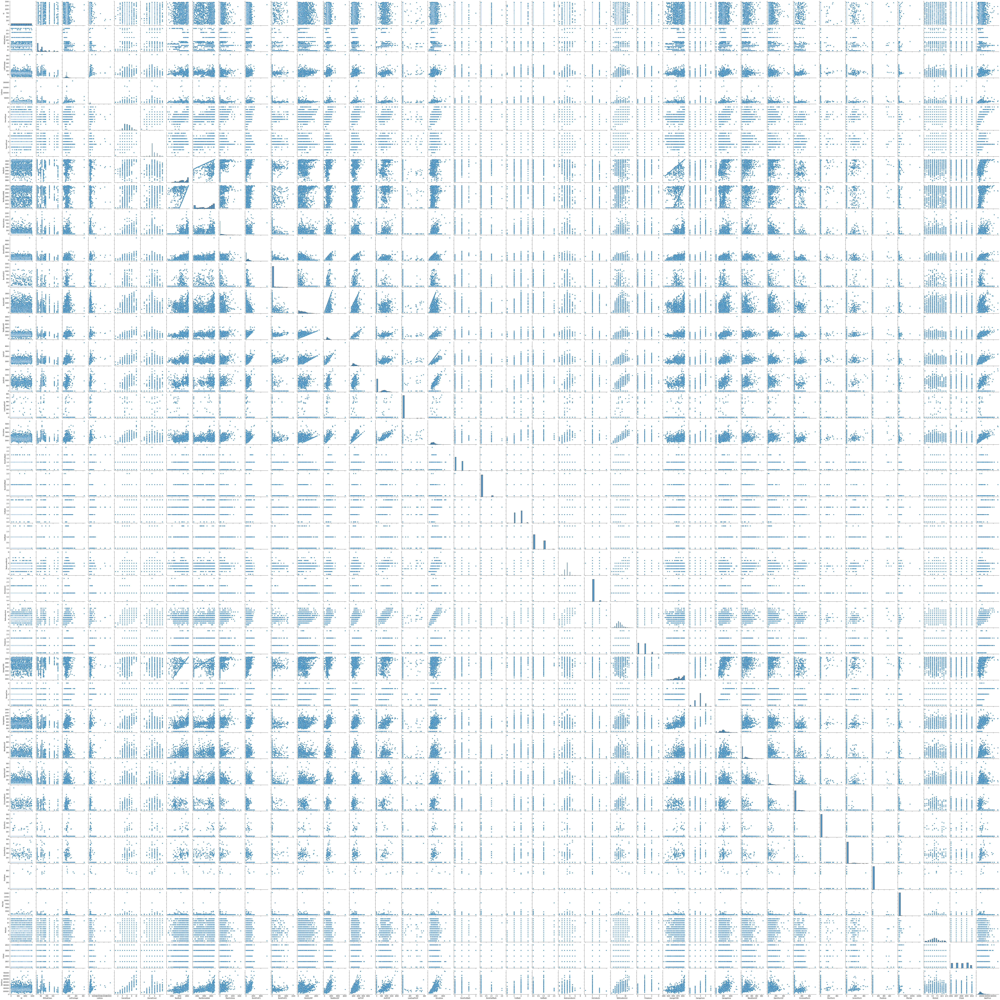

In [10]:
# Pair plot for distribution and density
sns.pairplot(num_df)
plt.show()

In [11]:
# EDA of categorical variables
# Missing value treatment
cat_df.fillna("None", inplace=True)

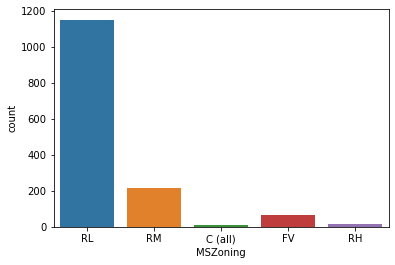

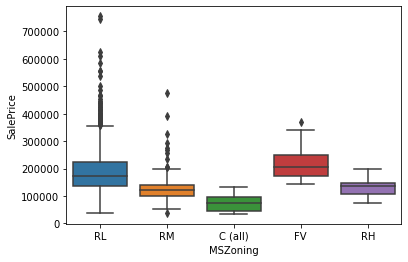

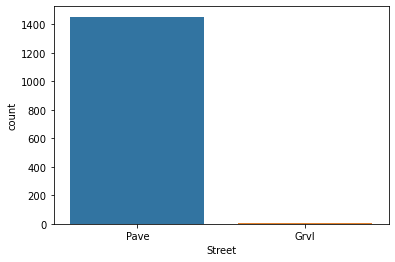

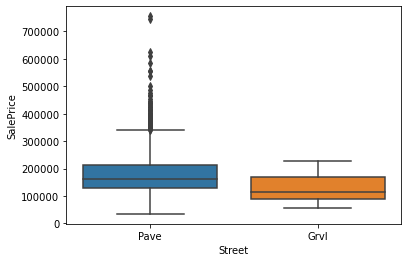

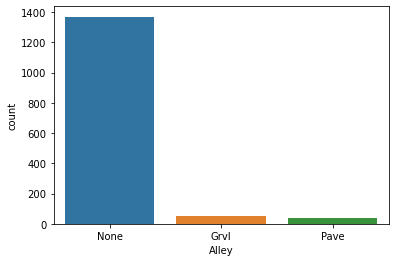

...

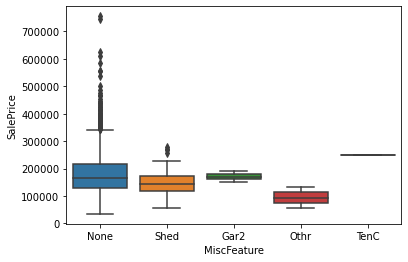

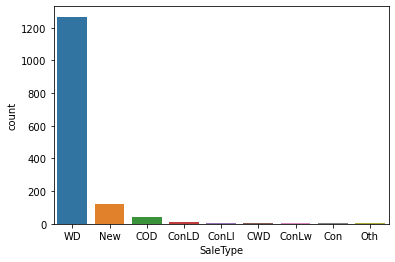

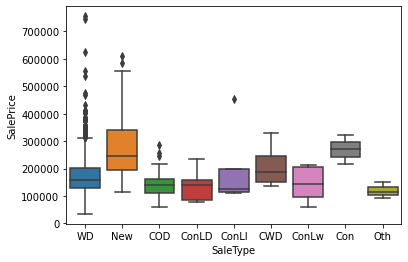

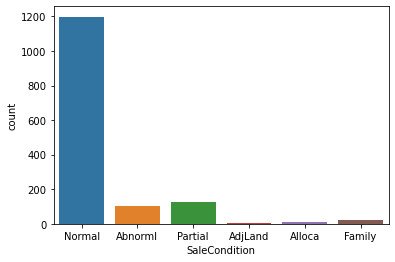

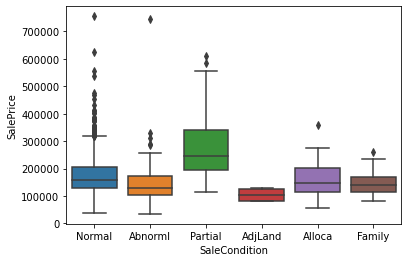

In [13]:
# Count plot and box plot for bivariate analysis
for col in cat_df.columns:
    # Create a countplot for the categorical variable
    sns.countplot(x=col, data=cat_df)
    plt.show()
    
    # Create a boxplot to analyze the relationship between the categorical variable and SalePrice
    sns.boxplot(x=col, y="SalePrice", data=df)
    plt.show()

In [14]:
# Identify significant variables using p-values and Chi-Square values
# Perform statistical tests
        
# Combine all the significant categorical and numerical variables
significant_vars = ["OverallQual", "GrLivArea", "GarageCars", "TotalBsmtSF", "FullBath", "YearBuilt", 
                            "YearRemodAdd", "GarageYrBlt", "MasVnrArea", "Fireplaces", "BsmtFinSF1", "LotArea", 
                            "Neighborhood", "Exterior1st", "ExterQual", "KitchenQual", "BsmtQual", "GarageFinish"]
new_df = df[significant_vars]

In [25]:
# Plot box plot for the new dataset to find the variables with outliers
def plot_outliers(new_df):
    try:
        for col in new_df.columns:
            sns.boxplot(x=col, data=new_df)
            plt.show()

        return new_df

    except Exception as e:
        # Log the error
        print(f"Error: {e}")
        return pd.DataFrame()